# Decision Trees 2

Recall that our data set looks like this:





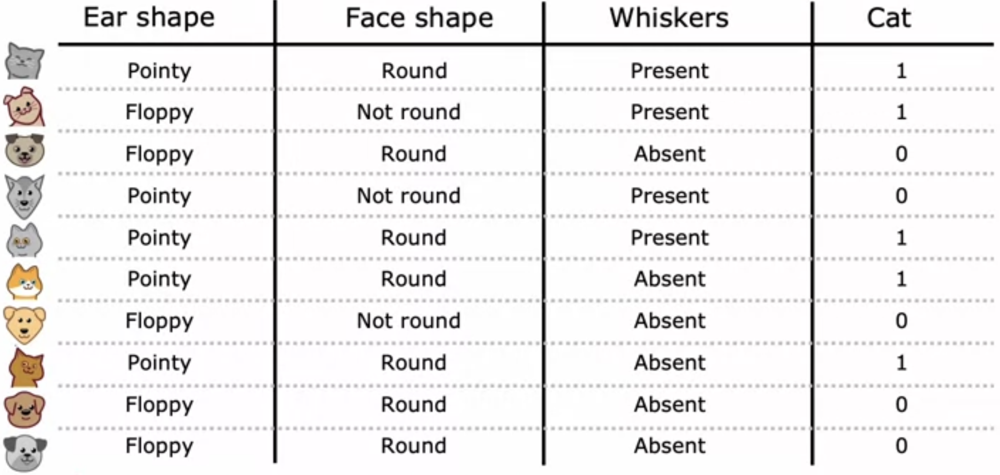

Recall that our decision tree algorithm so far only handles inputs that are binary categories.
Here, these are ear shape being pointy or floppy, face shape being round or not round, or
whiskers being present or absent.  

Today we will show how to handle inputs with more than two categories.

Suppose we expand our data set to include ear shapes that are pointy, floppy, or oval:

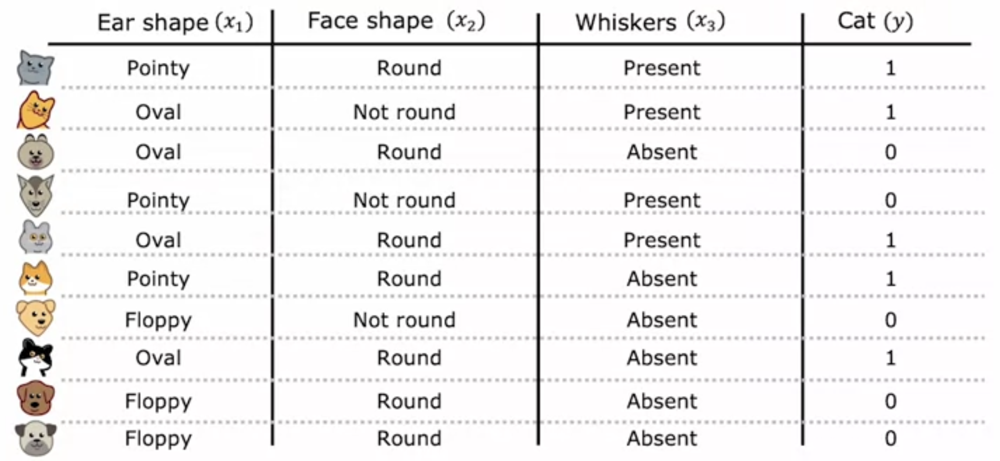

The standard way of handling this situation is to use one-hot vectors.  Remember that a **one-hot vector** is
an array or vector of numbers with all zeroes, except for one "1".

What we will do is turn each **value** for a feature into its own **binary feature**.  So for the ear shape feature,
we will create three new features, called pointy, oval, and floppy.  Exactly one of those three features will be true
for each original training example.

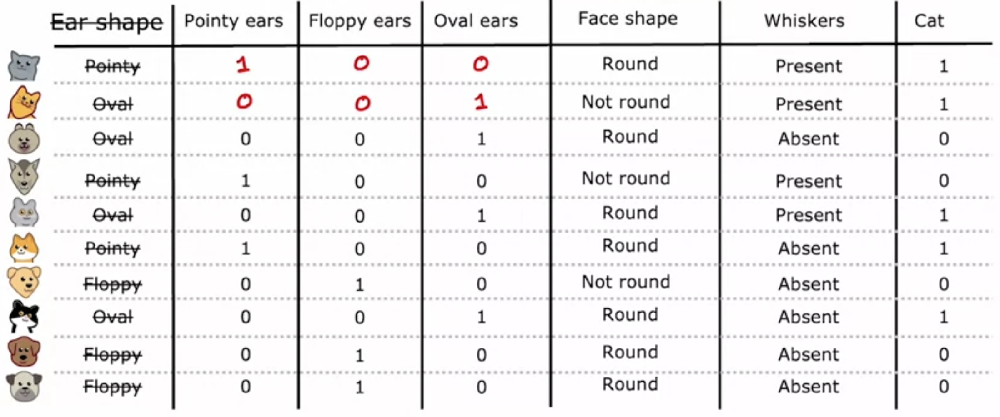

Note that you **can** choose to not do this, and use multiway splitting at a node instead.  In 
other words, there is a way to adapt the entropy formula to work with more than two values, but this way (one-hot vectors)
is easier because then the math works exactly the same way as before.

Note that this is also the standard way to turn categorical features into numeric features to use with linear
regression, logistic regression, or neural networks.  Those three types of models only accept numeric features,
so we need to use a 0/1 binary encoding for each possible feature value to get equivalent numbers.

## Continuous-valued features (non-categorical)

Imagine we have data that looks like this:
    
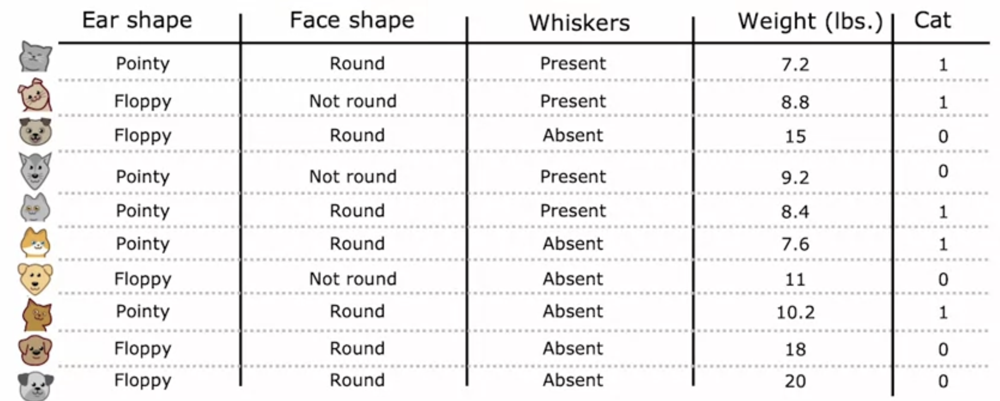

Notice that now we have the weight of the animal as a feature.  This is a useful feature because overall, dogs typically
weigh more than cats, though there can be some larger cats that might weigh more than smaller dogs.

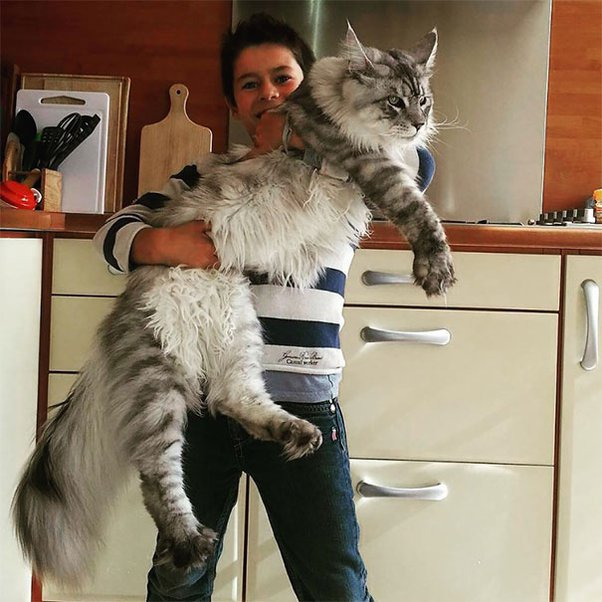

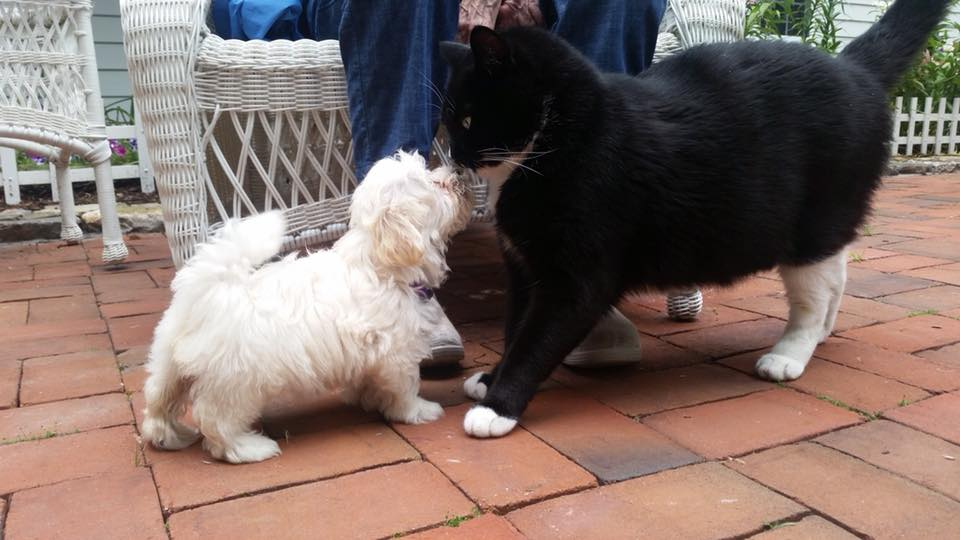

How do we use a numeric feature like this in training a decision tree?  The problem would arise
when we need to figure out how to split on the weight feature --- because weight could be potentially
any number, it's not clear how to create a split on this feature.

  (We call numeric features like this **continuous values**: mathematically that means that a feature like this
  could be any number within a specific range, including floating point/decimal values.  Technically, a 
  feature that only takes integer values is not continouous (mathematically speaking) but we can still use
  the techniques here to process those features as well.)
  


So during the decision tree training, whenever we consider splitting on face shape, ear
shape, or whiskers, we will also consider splitting on weight with the criteria being:

$$\text{weight} \leq n$$

where $n$ is some number.  Notice that using a split like this would also split whatever
training examples we have into two categories, just like any other split on a different attribute.

But how do we determine what $n$ should be?  Like before, we will use information gain, but it may not be
clear what value of $n$ leads to split that gives us the best information gain.  So we will evaluate *many*
possible values of $n$.

The procedure we will use is first sort all of the values of weight that are present in our training set 
(but only the values at the current node, if we're not at the root of the tree anymore).

Then we consider as potential values of $n$ any number that is halfway between two consecutive numbers
in this sorted list.

So for instance (as a smaller example), imagine that there were only 3 training examples in our data set,
with weights of 7.2, 8.8, and 15 (I just used the first three numbers from the data above).  We would consider
splitting at the midpoint of 7.2 and 8.8 (which is 8), or at the midpoint of 8.8 and 15 (11.9).

Each one of these potential values of $n$ will generate an information gain.  Let's work through the math, pretending that we only have the first three training examples from above (2 cats and 1 dog).

If we split at 8, then the node would be "weight <= 8", and therefore one cat would go to the left,
and the other cat and the dog would go to the right.  So the information gain would be:

$$H(2/3) - \left( (1/3)H(1/1) + (2/3)H(1/2) \right) \approx 0.252$$

Here's the math for the other potential split (at 11.9).  Here, both cats go to the left, and the dog goes
to the right:

$$H(2/3) - \left( (2/3)H(2/2) + (1/3)H(0/1) \right) \approx 0.918$$

(This calculation reduces nicely because this split value of 8 splits the classes perfectly.)

So we would prefer the split at 11.9 over the split at 8.  

So one rule to remember is that if you have $m$ training examples at a node, you will test $m-1$ possible
split points.

**To summarize**, when considering a data set with continous-valued features, you will consider
splitting at each possible binary feature, but also a number of possible split points for every
continuous feature.  For very large datasets, you may have to consider a huge number of split points!

## Regression trees

It turns out that decision trees can be used not only in classification tasks, but in regression tasks as well.

Let's say that we use this data set now:

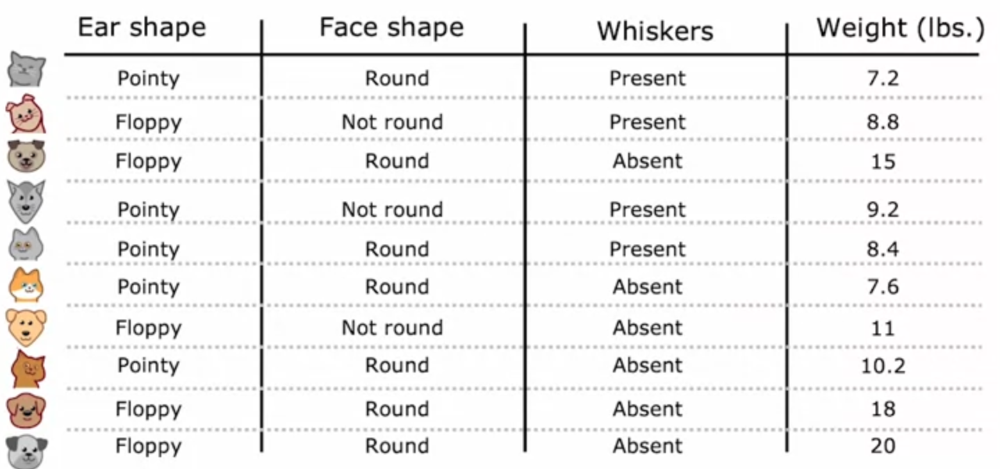

Suppose we want to predict **weight** from ear shape, face shape, and whiskers.  Note this is different than
what we were doing before, when weight was an input feature.  Now it's our target feature.



A regression tree looks a lot like a "regular" decision tree.  The only difference is that
leaf nodes no longer will be labeled with an output category (like "cat" or "not cat"), but rather
a single number that will be our "output" number.  So unlike in linear regression or neural networks for
regression, where the output number is determined by a formula (usually represented by $f(x)$), we don't
use a formula to calculate our output, we just follow the tree as normal and output the number at a leaf node.

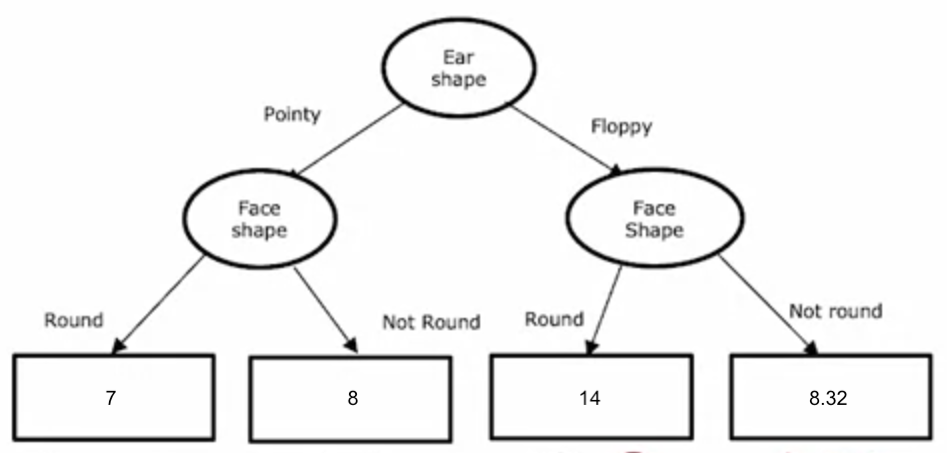

The tree above is just an example---it's not derived from any real training examples.

Real decision trees determine the numbers they output at leaf nodes by **averaging the values
of the target feature** at leaf nodes.

For instance, there are four animals in our data set with pointy ears and round face shapes (that would
be at the left-most leaf node above).  Therefore, instead of the 7, a decision tree learning algorithm
would average the weights of those four animals, which are 7.2, 8.4, 7.6, and 10.2, to get about 8.35.

The other values in the leaf nodes should be 9.2, 17.7, and 9.9:

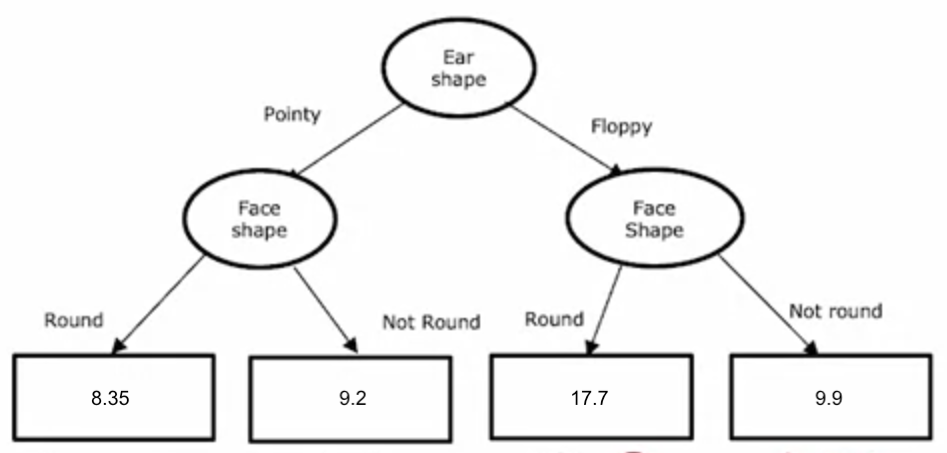



### How to determine split points in regression trees

Splitting in regression trees works a little bit differently than it does with regular decision trees,
because the concept of entropy doesn't make as much sense here.  Remember that entropy was calculated
from the percentage or proportion of training examples that were in one (target) category or another at a node; but now our target variable is not categorical, it's a number.  So we need a different way to measure
how good a split is other than entropy.

Instead of trying to reduce entropy (or increase purity), we will try to reduce the **variance** among
the values of the target variable at a node.

Consider the first potential split in creating a regression tree from scratch: what to do at the root node.
There are three potential features to split on:

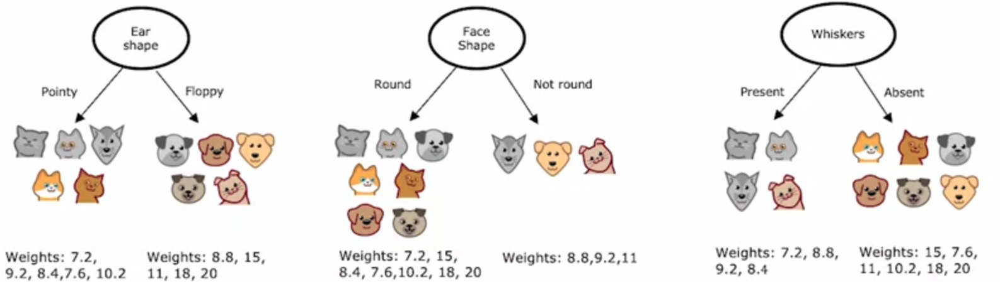

For each of these potential features to split on, we want to compute the variance of the
weights at each of the left/right child nodes that are created.

Variance of a sample (not a population) is usually defined as:

$$\frac{1}{n-1} \sum_{i=1}^n (Y_i-mean(Y))^2$$

The way to think about variance is that it measures how "spread out" a set of numbers is.  Numbers
that are all clustered very tightly together will have a lower variance than numbers that are more
widely spaced apart.  This is because we are calculating, for each number in the set, the squared difference
between the number and the mean of the entire set of numbers.  So numbers that cluster more tightly together
around the mean will naturally have smaller squared differences.  And then the summation and dividing by $n-1$ somewhat
correspond to "averaging" all of these squared differences, so you can think of variance as the "average 
squared distance" between the numbers and the mean of the numbers.

The $n-1$ in the denominator is a little tricky to understand, though.  If we're averaging $n$ things, shouldn't
we divide by $n$?  It turns out, for statistical reasons, that dividing by $n$ results in estimates of the
variance that are just slightly too small, so we divide by $n-1$ instead.  (The reasons for this are
well-understood, but are better explained in a statistics course.)

So we calculate the variance for all of the weights at each node:

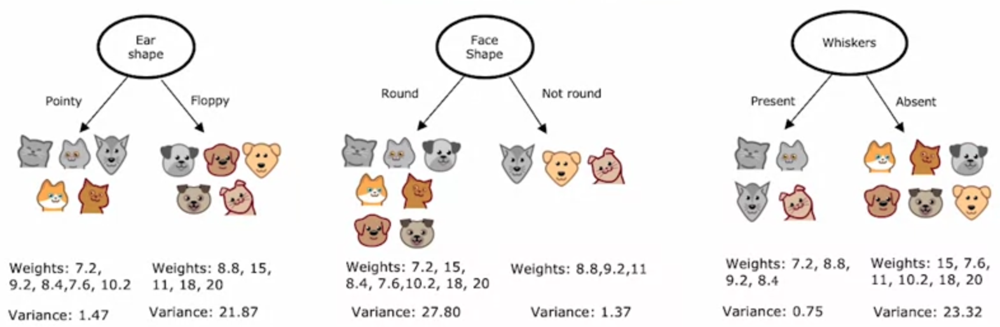

and then take weighted averages just like for entropy:

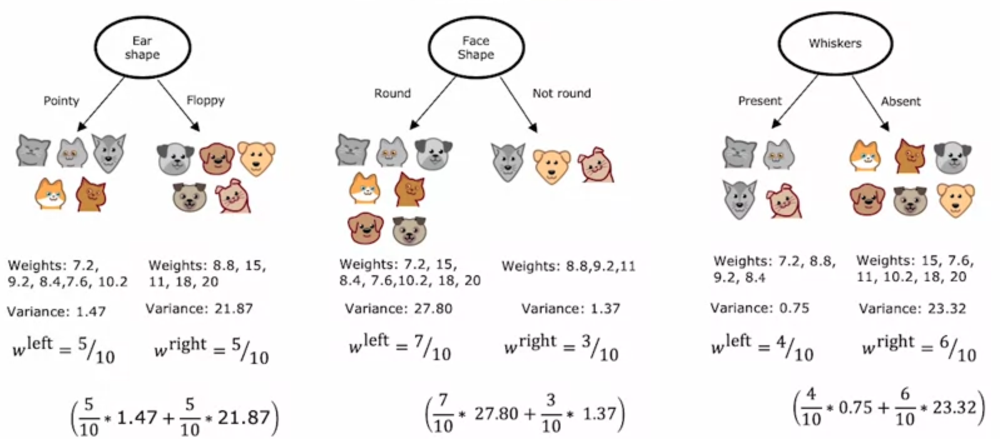

We then perform a similar calculation to information gain.  Remember that information 
gain is the **difference** between entropy at a parent node and the weighted average of entropy at a node
in question.  We perform the same calculation here, but substitute variance for entropy, so we are measuring **the reduction in variance**.

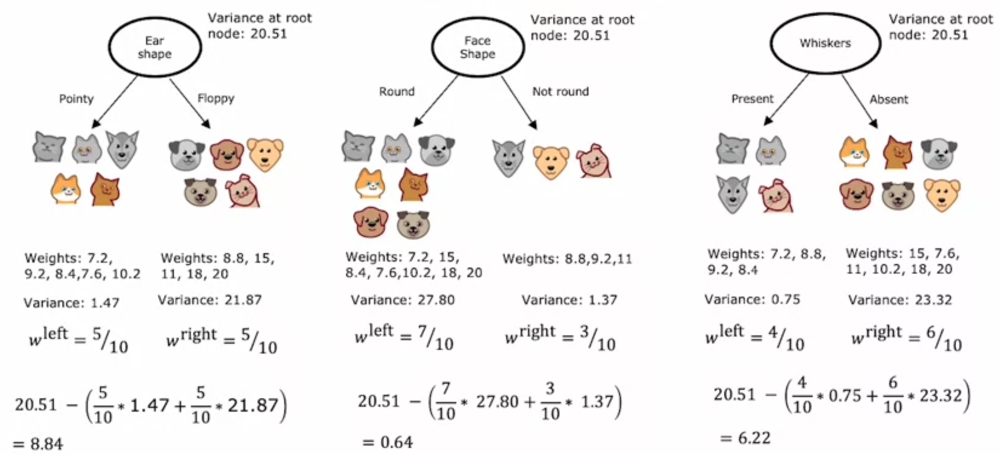


So we pick the feature that gives us the largest reduction in variance, which is **ear shape**,
since 8.84 is the biggest of the three numbers.